In [1]:
!pip install rasterio
!pip install geopandas
!pip install xgboost

In [2]:
path_img= '/Users/omvishal/Desktop/MINOR/sentinel2_2023.tif'

In [3]:
import rasterio

from rasterio.plot import show

import xgboost as xgb

import numpy as np

from matplotlib import pyplot as plt

from matplotlib import cm

from matplotlib.colors import ListedColormap

import pandas as pd

import seaborn as sns

import geopandas as gpd

In [4]:
src = rasterio.open(path_img)

In [5]:
img = src.read()

In [6]:
img

array([[[    nan, 0.06285, 0.06285, ..., 0.0576 , 0.0527 , 0.0527 ],
        [    nan, 0.06285, 0.06285, ..., 0.0576 , 0.0527 , 0.0527 ],
        [    nan, 0.06285, 0.06285, ..., 0.0576 , 0.0527 , 0.0527 ],
        ...,
        [    nan, 0.065  , 0.065  , ..., 0.0585 , 0.0585 , 0.0585 ],
        [    nan, 0.0761 , 0.0761 , ..., 0.0585 , 0.0585 , 0.0585 ],
        [    nan, 0.0761 , 0.0761 , ..., 0.0585 , 0.0585 , 0.0585 ]],

       [[    nan, 0.0507 , 0.0507 , ..., 0.0731 , 0.076  , 0.0691 ],
        [    nan, 0.05715, 0.05715, ..., 0.0661 , 0.067  , 0.0658 ],
        [    nan, 0.0771 , 0.0771 , ..., 0.0679 , 0.0668 , 0.0634 ],
        ...,
        [    nan, 0.0836 , 0.1065 , ..., 0.0632 , 0.0651 , 0.0651 ],
        [    nan, 0.1143 , 0.1324 , ..., 0.0796 , 0.1018 , 0.0855 ],
        [    nan, 0.0789 , 0.0967 , ..., 0.0934 , 0.1014 , 0.1006 ]],

       [[    nan, 0.0806 , 0.0806 , ..., 0.1004 , 0.0977 , 0.0918 ],
        [    nan, 0.0911 , 0.0911 , ..., 0.0916 , 0.0904 , 0.0908 ],
    

In [7]:
img.shape

(12, 3235, 2738)

In [8]:
img = img.transpose([1,2,0])

In [9]:
red = img[:,:,3]
green = img[:,:,2]
blue = img[:,:,1]

In [10]:
rgb = np.dstack((red, green, blue))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(-0.5, 2737.5, 3234.5, -0.5)

/Applications/anaconda3/lib/python3.11/site-packages/matplotlib/cm.py:478: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


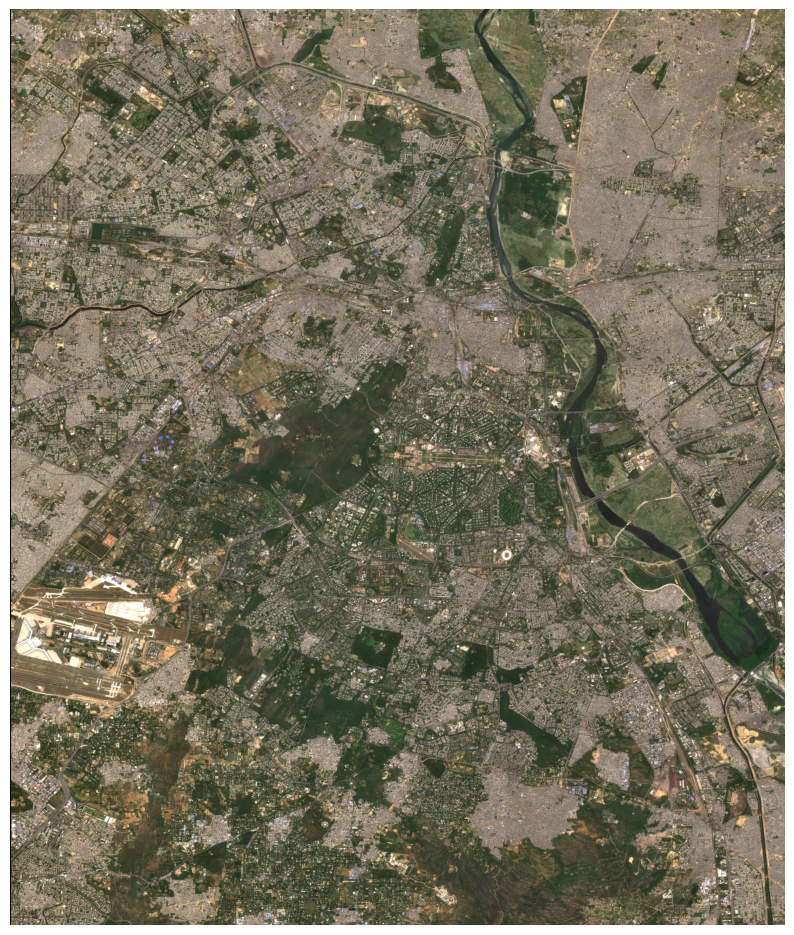

In [11]:
plt.figure(figsize =[10,20])
plt.imshow(rgb*4)
plt.axis('off')


In [12]:
samples = gpd.read_file('/Users/omvishal/Desktop/MINOR/new_shp/point_new.shp')

In [13]:
samples

,Class,sam_B1,sam_B2,sam_B3,sam_B4,sam_B5,sam_B6,sam_B7,sam_B8,sam_B8A,sam_B9,sam_B10,sam_B11,sam_B12,sam_Class,sam_sample,sam_ClassN,geometry
0,1,1657,1423,1272,998,1392,1591,1622,1432,1428,326,10,521,307,1,test,Water,POINT (77.22615 28.74811)
1,1,1657,1423,1272,998,1392,1591,1622,1432,1428,326,10,521,307,1,test,Water,POINT (77.22649 28.74510)
2,1,1657,1423,1272,998,1392,1591,1622,1432,1428,326,10,521,307,1,test,Water,POINT (77.16899 28.74118)
3,1,1657,1423,1272,998,1392,1591,1622,1432,1428,326,10,521,307,1,test,Water,POINT (77.23147 28.73712)
4,1,1657,1423,1272,998,1392,1591,1622,1432,1428,326,10,521,307,1,test,Water,POINT (77.15980 28.73763)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
140,4,1751,1484,1449,1402,1538,1999,2187,2248,2260,629,13,1696,1244,4,test,Barrenland,POINT (77.09224 28.60130)
141,4,1751,1484,1449,1402,1538,1999,2187,2248,2260,629,13,1696,1244,4,test,Barrenland,POINT (77.08604 28.60105)
142,4,1751,1484,1449,1402,1538,1999,2187,2248,2260,629,13,1696,1244,4,test,Barrenland,POINT (77.21165 28.58488)
143,4,1751,1484,1449,1402,1538,1999,2187,2248,2260,629,13,1696,1244,4,test,Barrenland,POINT (77.29734 28.72018)


In [14]:
samples = samples.to_crs('EPSG:4326')

In [15]:
print(samples.crs)

EPSG:4326


In [16]:
print(src.crs)

GEOGCS["WGS 84",DATUM["World Geodetic System 1984",SPHEROID["WGS 84",6378137,298.257223563]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AXIS["Latitude",NORTH],AXIS["Longitude",EAST]]


ERROR 1: PROJ: internal_proj_identify: /Applications/anaconda3/share/proj/proj.db lacks DATABASE.LAYOUT.VERSION.MAJOR / DATABASE.LAYOUT.VERSION.MINOR metadata. It comes from another PROJ installation.


In [17]:
cmap = ListedColormap(['yellow','red','green','blue'])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<Axes: >

/Applications/anaconda3/lib/python3.11/site-packages/matplotlib/cm.py:478: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


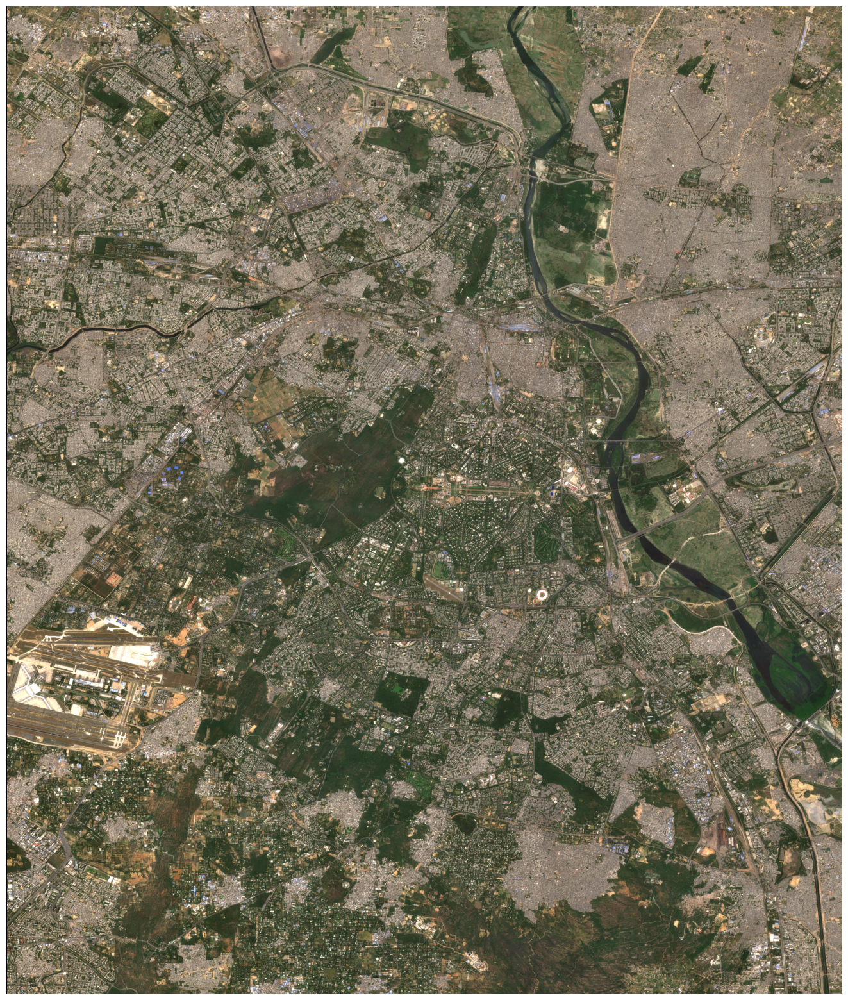

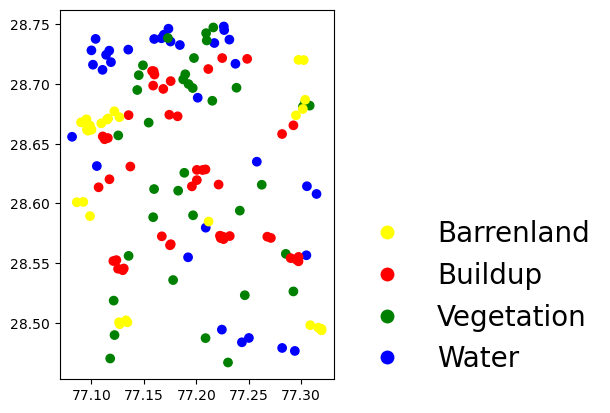

In [18]:
cmap = ListedColormap(['yellow','red', 'green', 'blue'])
fig, ax = plt.subplots(figsize=(20, 20))
samples.plot(column='sam_ClassN', categorical=True, cmap=cmap, legend=True, legend_kwds={'bbox_to_anchor':(1, 0.5), 'loc':'upper left', 'fontsize':20, 'frameon':False})
ax.axis('off')
show(rgb.transpose([2, 0, 1])*4, transform=src.transform, ax=ax)

In [19]:
samples['geometry']

0      POINT (77.22615 28.74811)
1      POINT (77.22649 28.74510)
2      POINT (77.16899 28.74118)
3      POINT (77.23147 28.73712)
4      POINT (77.15980 28.73763)
                 ...            
140    POINT (77.09224 28.60130)
141    POINT (77.08604 28.60105)
142    POINT (77.21165 28.58488)
143    POINT (77.29734 28.72018)
144    POINT (77.30229 28.72000)
Name: geometry, Length: 145, dtype: geometry

In [20]:
array_samples = []
for idx, point in enumerate(samples['geometry']):
    x = point.xy[0][0]
    y = point.xy[1][0]
    print(f"Processing point {idx + 1} at coordinates ({x}, {y})")
    row, col = src.index(x, y)
    print(f"Corresponding pixel indices: row={row}, col={col}")
    band_values = []
    for i in range(src.count):
        band_values.append(src.read(i + 1)[row, col])
    print(f"Pixel values for point {idx + 1}: {band_values}")
    array_samples.append(band_values)


Processing point 1 at coordinates (77.22615117434412, 28.748105871358895)
Corresponding pixel indices: row=88, col=1662
Pixel values for point 1: [0.041600000000000005, 0.038200000000000005, 0.047400000000000005, 0.0369, 0.05, 0.0395, 0.0344, 0.0352, 0.0317, 0.0429, 0.031400000000000004, 0.024]
Processing point 2 at coordinates (77.22649449709803, 28.74509577095377)
Corresponding pixel indices: row=122, col=1666
Pixel values for point 2: [0.0431, 0.0468, 0.0529, 0.041100000000000005, 0.0533, 0.040600000000000004, 0.042300000000000004, 0.0379, 0.0337, 0.0403, 0.0332, 0.024]
Processing point 3 at coordinates (77.16898793581873, 28.741182510747198)
Corresponding pixel indices: row=165, col=1026
Pixel values for point 3: [0.0395, 0.052000000000000005, 0.0708, 0.0589, 0.11560000000000001, 0.1095, 0.10930000000000001, 0.0932, 0.07970000000000001, 0.0426, 0.0267, 0.024]
Processing point 4 at coordinates (77.23147267702967, 28.737118585384877)
Corresponding pixel indices: row=210, col=1721
Pix

Pixel values for point 30: [0.0307, 0.03305, 0.039850000000000003, 0.0351, 0.0534, 0.06585, 0.0834, 0.07475, 0.0781, 0.16605, 0.0623, 0.03755]
Processing point 31 at coordinates (77.10512603320129, 28.631328847476716)
Corresponding pixel indices: row=1388, col=315
Pixel values for point 31: [0.07145, 0.1346, 0.16870000000000002, 0.21030000000000001, 0.23065000000000002, 0.2767, 0.29600000000000004, 0.3184, 0.31895, 0.30235, 0.3678, 0.3134]
Processing point 32 at coordinates (77.31452348812631, 28.6079569881997)
Corresponding pixel indices: row=1648, col=2646
Pixel values for point 32: [0.046, 0.0461, 0.07, 0.057, 0.10740000000000001, 0.2612, 0.2974, 0.33630000000000004, 0.31270000000000003, 0.2469, 0.16440000000000002, 0.08710000000000001]
Processing point 33 at coordinates (77.30538251980356, 28.61443707550834)
Corresponding pixel indices: row=1576, col=2544
Pixel values for point 33: [0.0844, 0.07740000000000001, 0.0965, 0.0872, 0.11460000000000001, 0.20140000000000002, 0.224, 0.2427

Pixel values for point 58: [0.0284, 0.035300000000000005, 0.0601, 0.0398, 0.0916, 0.23120000000000002, 0.2772, 0.2866, 0.2927, 0.269, 0.1458, 0.0781]
Processing point 59 at coordinates (77.14511549264688, 28.707368446577856)
Corresponding pixel indices: row=542, col=760
Pixel values for point 59: [0.0446, 0.0555, 0.09825, 0.07045, 0.1529, 0.29655000000000004, 0.3331, 0.38220000000000004, 0.35035, 0.33380000000000004, 0.25575000000000003, 0.1615]
Processing point 60 at coordinates (77.14365924759518, 28.694954981134856)
Corresponding pixel indices: row=680, col=744
Pixel values for point 60: [0.0425, 0.04235, 0.06670000000000001, 0.057050000000000003, 0.10495, 0.23465, 0.26775, 0.26990000000000003, 0.2873, 0.2846, 0.18845, 0.11275]
Processing point 61 at coordinates (77.13542797663666, 28.55616877716168)
Corresponding pixel indices: row=2225, col=652
Pixel values for point 61: [0.0345, 0.0376, 0.057600000000000005, 0.0557, 0.09335, 0.1874, 0.20705, 0.2117, 0.2255, 0.21760000000000002, 0

Pixel values for point 86: [0.1078, 0.1246, 0.1418, 0.1544, 0.1584, 0.1612, 0.1578, 0.17070000000000002, 0.171, 0.1839, 0.18780000000000002, 0.1622]
Processing point 87 at coordinates (77.28985949307686, 28.554296634492033)
Corresponding pixel indices: row=2246, col=2371
Pixel values for point 87: [0.1014, 0.1206, 0.1318, 0.1418, 0.1521, 0.15460000000000002, 0.1573, 0.16290000000000002, 0.1642, 0.1617, 0.163, 0.1433]
Processing point 88 at coordinates (77.29737504273658, 28.55528613189879)
Corresponding pixel indices: row=2235, col=2455
Pixel values for point 88: [0.0892, 0.1386, 0.1524, 0.1714, 0.1907, 0.20270000000000002, 0.20950000000000002, 0.1956, 0.2069, 0.20450000000000002, 0.21150000000000002, 0.1869]
Processing point 89 at coordinates (77.29733212739235, 28.55160138487055)
Corresponding pixel indices: row=2276, col=2454
Pixel values for point 89: [0.10360000000000001, 0.1154, 0.1272, 0.1446, 0.1807, 0.1837, 0.18610000000000002, 0.166, 0.19360000000000002, 0.1733, 0.19090000000

Pixel values for point 114: [0.0763, 0.129, 0.1442, 0.15460000000000002, 0.1569, 0.19940000000000002, 0.21030000000000001, 0.19310000000000002, 0.2185, 0.2078, 0.1741, 0.1353]
Processing point 115 at coordinates (77.13540596077836, 28.673925595536723)
Corresponding pixel indices: row=914, col=652
Pixel values for point 115: [0.0849, 0.1322, 0.1507, 0.1661, 0.1575, 0.1889, 0.1967, 0.20885, 0.2119, 0.1757, 0.1809, 0.14485]
Processing point 116 at coordinates (77.3085633258738, 28.498182803583035)
Corresponding pixel indices: row=2870, col=2579
Pixel values for point 116: [0.0955, 0.1312, 0.198, 0.2564, 0.2752, 0.2898, 0.3035, 0.3008, 0.3084, 0.30360000000000004, 0.3765, 0.3436]
Processing point 117 at coordinates (77.31625600889684, 28.496072387883963)
Corresponding pixel indices: row=2894, col=2665
Pixel values for point 117: [0.0937, 0.12760000000000002, 0.17200000000000001, 0.2248, 0.2497, 0.2523, 0.2581, 0.2666, 0.2625, 0.21860000000000002, 0.3159, 0.305]
Processing point 118 at coor

Pixel values for point 142: [0.06745000000000001, 0.1363, 0.1951, 0.24020000000000002, 0.24195, 0.2889, 0.3045, 0.3164, 0.32575000000000004, 0.26580000000000004, 0.33305, 0.2988]
Processing point 143 at coordinates (77.21165256533511, 28.58487560377192)
Corresponding pixel indices: row=1905, col=1501
Pixel values for point 143: [0.0889, 0.1526, 0.1754, 0.2048, 0.1744, 0.2119, 0.23450000000000001, 0.2685, 0.23600000000000002, 0.2137, 0.21030000000000001, 0.1791]
Processing point 144 at coordinates (77.29733904728724, 28.720177377808657)
Corresponding pixel indices: row=399, col=2455
Pixel values for point 144: [0.094, 0.1432, 0.1724, 0.2172, 0.2212, 0.2262, 0.2343, 0.2511, 0.23870000000000002, 0.1824, 0.2697, 0.2651]
Processing point 145 at coordinates (77.30229065079826, 28.71999755861255)
Corresponding pixel indices: row=401, col=2510
Pixel values for point 145: [0.076, 0.1164, 0.13920000000000002, 0.17170000000000002, 0.1626, 0.2119, 0.2285, 0.2426, 0.23850000000000002, 0.22940000000

In [21]:
X = np.array(array_samples)

In [22]:
X.shape

(145, 12)

In [23]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import LabelEncoder

In [24]:
samples['sam_ClassN']

0           Water
1           Water
2           Water
3           Water
4           Water
          ...    
140    Barrenland
141    Barrenland
142    Barrenland
143    Barrenland
144    Barrenland
Name: sam_ClassN, Length: 145, dtype: object

In [25]:
Y= samples['sam_ClassN'].values

In [26]:
labelencoder = LabelEncoder()

Y = labelencoder.fit_transform(Y)

In [27]:
Y

array([3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

In [28]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size= 0.3, random_state = 42)

In [29]:
clf = xgb.XGBClassifier(objective="multi:softprob", random_state=42, verbosity=3, n_estimators=500, max_depth=10, nthread=8, n_jobs=8, learning_rate=0.01)

In [30]:
clf.fit(X_train, Y_train)

[13:16:40] ======== Monitor (0): HostSketchContainer ========
[13:16:40] AllReduce: 0.006015s, 1 calls @ 6015us

[13:16:40] MakeCuts: 0.006363s, 1 calls @ 6363us

[13:16:40] DEBUG: /Users/runner/work/xgboost/xgboost/src/gbm/gbtree.cc:130: Using tree method: 0
[13:16:41] ======== Monitor (0): Learner ========
[13:16:41] Configure: 0.002175s, 1 calls @ 2175us

[13:16:41] EvalOneIter: 0.000544s, 500 calls @ 544us

[13:16:41] GetGradient: 0.003275s, 500 calls @ 3275us

[13:16:41] PredictRaw: 0.000102s, 500 calls @ 102us

[13:16:41] UpdateOneIter: 0.346017s, 500 calls @ 346017us

[13:16:41] ======== Monitor (0): GBTree ========
[13:16:41] BoostNewTrees: 0.339748s, 500 calls @ 339748us

[13:16:41] CommitModel: 0.00012s, 500 calls @ 120us

[13:16:41] ======== Monitor (0): HistUpdater ========
[13:16:41] BuildHistogram: 0.10181s, 7714 calls @ 101810us

[13:16:41] EvaluateSplits: 0.106134s, 9714 calls @ 106134us

[13:16:41] InitData: 0.014585s, 2000 calls @ 14585us

[13:16:41] InitRoot: 0.04770

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.01, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=10, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=500, n_jobs=8, nthread=8,
              num_parallel_tree=None, ...)

In [31]:
print("Accuracy on training set: {:.2f}".format(clf.score(X_train, Y_train)))

[13:16:41] DEBUG: /Users/runner/work/xgboost/xgboost/src/gbm/gbtree.cc:130: Using tree method: 0
Accuracy on training set: 1.00


In [32]:
print("Accuracy on test set : {:.2f}".format(clf.score(X_test, Y_test)))

Accuracy on test set : 0.82


In [33]:
y_pred = clf.predict(X_test)

In [34]:
print(classification_report(Y_test, y_pred))

              precision    recall  f1-score   support

           0       0.80      0.89      0.84         9
           1       0.92      0.80      0.86        15
           2       0.64      0.88      0.74         8
           3       0.90      0.75      0.82        12

    accuracy                           0.82        44
   macro avg       0.81      0.83      0.81        44
weighted avg       0.84      0.82      0.82        44



In [35]:
c_matrix = confusion_matrix(Y_test, y_pred)

In [36]:
names = ['Bareland', 'Buildup', 'Vegetation','Waterbody']

Text(0.5, 58.7222222222222, 'Predict')

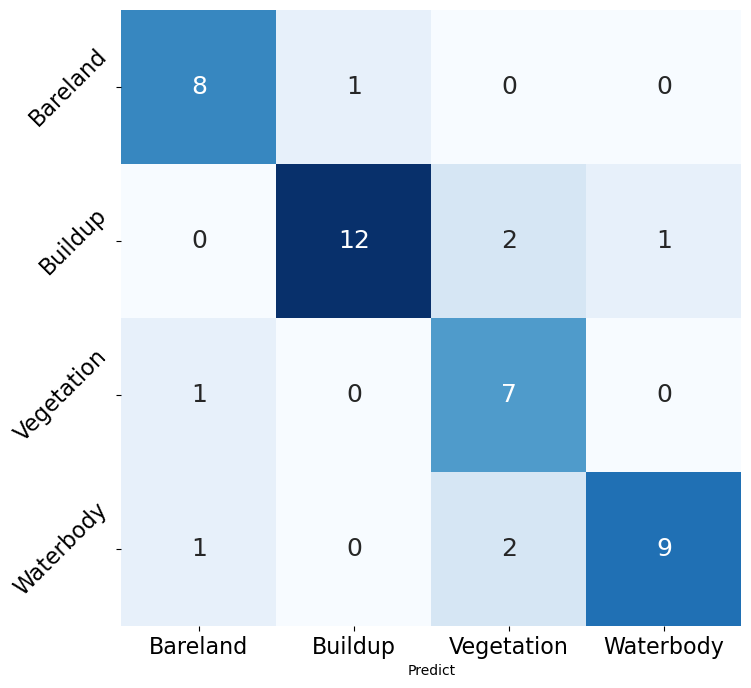

In [37]:
r1 = pd.DataFrame(data=c_matrix, index=names , columns=names)
fig, ax = plt.subplots(figsize=(8, 8))
ax = sns.heatmap(r1, annot=True, annot_kws={"size": 18}, fmt='d', cmap="Blues", cbar=False)
# for t in ax.texts: t.set_text(t.get_text() +"%")
ax.tick_params(labelsize=16)
ax.set_yticklabels(names, rotation=45)
ax.set_xlabel('Predict')


In [38]:
Predict_img = np.nan_to_num(img)

In [39]:
Predict_img.shape

(3235, 2738, 12)

In [40]:
Predict_img = Predict_img.reshape(img.shape[0]*img.shape[1],img.shape[2])

In [41]:
array_pred = clf.predict(Predict_img)

In [42]:
array_pred = array_pred.reshape(img.shape[0],img.shape[1])

(-0.5, 2737.5, 3234.5, -0.5)

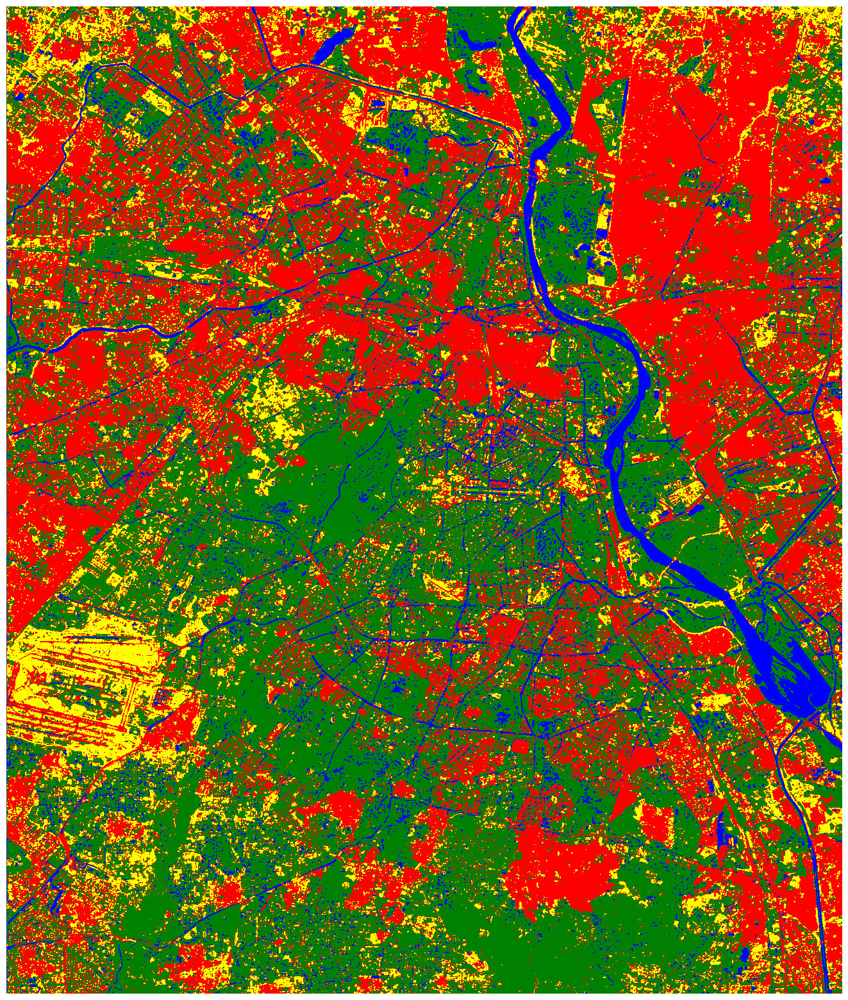

In [43]:
plt.figure(figsize=[20,20])
plt.imshow(array_pred, cmap= cmap)
plt.axis('off')

In [44]:
array_pred

array([[3, 2, 2, ..., 0, 0, 0],
       [3, 2, 2, ..., 2, 0, 0],
       [3, 2, 2, ..., 2, 2, 2],
       ...,
       [3, 2, 1, ..., 2, 2, 2],
       [3, 1, 1, ..., 2, 1, 2],
       [3, 2, 1, ..., 1, 1, 1]])

In [45]:
classes, quantidade = np.unique(array_pred, return_counts=True)

In [46]:
quantidade

array([ 989011, 3196176, 4074411,  597832])

In [47]:
areas = quantidade*20*20/1000000

In [48]:
nomes = ['Bareland' , 'Buildup' , 'Vegetation', 'Waterbody']

In [49]:
dados_stack=np.stack((classes, quantidade, areas, nomes))

In [50]:
dados_stack

array([['0', '1', '2', '3'],
       ['989011', '3196176', '4074411', '597832'],
       ['395.6044', '1278.4704', '1629.7644', '239.1328'],
       ['Bareland', 'Buildup', 'Vegetation', 'Waterbody']], dtype='<U32')

In [51]:
dados_stack.T

array([['0', '989011', '395.6044', 'Bareland'],
       ['1', '3196176', '1278.4704', 'Buildup'],
       ['2', '4074411', '1629.7644', 'Vegetation'],
       ['3', '597832', '239.1328', 'Waterbody']], dtype='<U32')

In [52]:
dados_stack

array([['0', '1', '2', '3'],
       ['989011', '3196176', '4074411', '597832'],
       ['395.6044', '1278.4704', '1629.7644', '239.1328'],
       ['Bareland', 'Buildup', 'Vegetation', 'Waterbody']], dtype='<U32')

In [53]:
df_dados = pd.DataFrame(data=dados_stack.T, columns=['Codigos', 'Qtd', 'Area km^2', 'Classes'])

In [54]:
df_dados['Area km^2'] = df_dados['Area km^2'].astype(float)

In [55]:
df_dados

,Codigos,Qtd,Area km^2,Classes
0,0,989011,395.6044,Bareland
1,1,3196176,1278.4704,Buildup
2,2,4074411,1629.7644,Vegetation
3,3,597832,239.1328,Waterbody


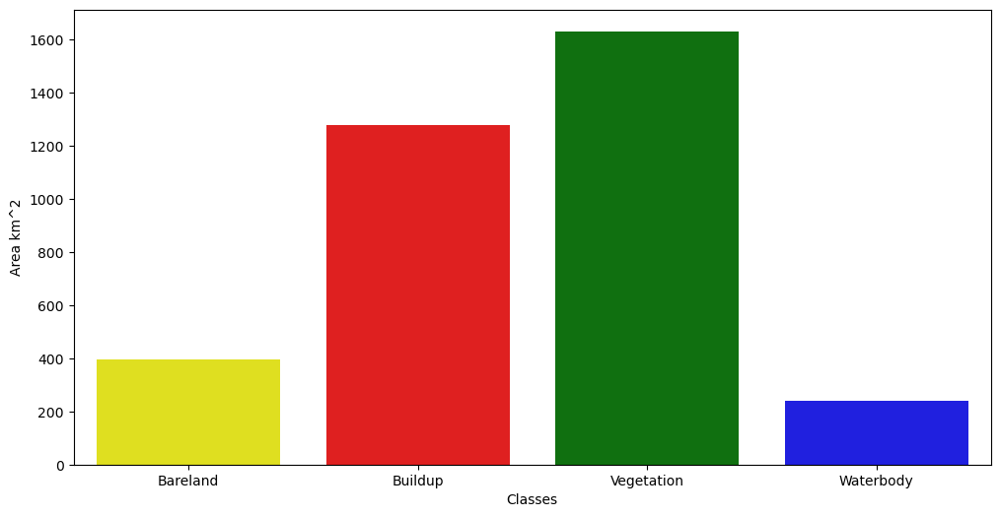

In [56]:
fig, ax1 = plt.subplots(figsize=(12,6))
ax1 = sns.barplot(x= 'Classes', y="Area km^2", data=df_dados, palette=cmap.colors)

In [57]:
percent = quantidade*100/quantidade.sum()

In [58]:
percent

array([11.16589123, 36.08468822, 45.99992323,  6.74949731])